# Set up

In [1]:
import sys
sys.path.insert(0, '/home/workspace/mm-analysis')
sys.path.insert(0, '/home/workspace/')

from py_util import *
from utilities import *

hdir = '/home/workspace/'
wdir = hdir + "/mm-analysis/EXP-01244"
pltdir = wdir + "/plots/"
srldir = wdir + "/objects/"

adata = sc.read_h5ad(srldir + 'subclustered_adata.h5ad')
# adata = sc.read_h5ad(srldir + 'processed_adata.h5ad')
# adata = adata[adata.obs['harmony'] == 'no harmony']

# UMAP of just week 2, 3, and 4

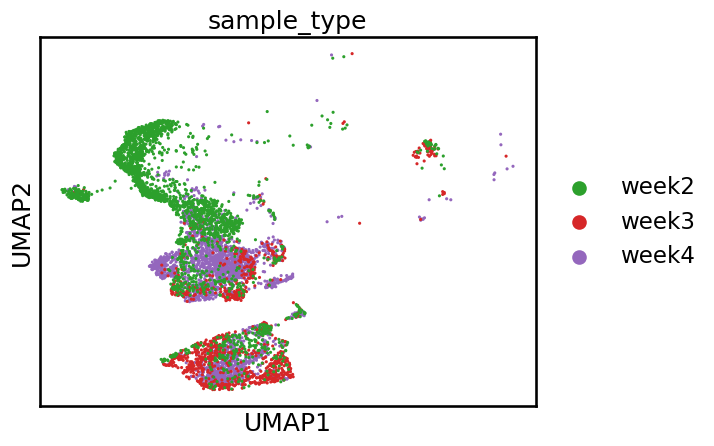

In [35]:
adata = adata[~adata.obs['sample_type'].isin(['bm', 'msc'])]

sc.pl.umap(adata, color='sample_type')

# Individual clusters UMAP

In [53]:
def plot_UMAPs(adata, sample = None, savefig = False):
    if sample is not None:
        x_adata = adata[adata.obs['sample_type'] == sample]
    else:
        x_adata = adata
        sample = 'all'

    clusters = list(x_adata.obs['sub_leiden'].unique())
    clusters = sorted(clusters, key=natural_key)
    
    fig, ax = subplot_grids(len(clusters), subplot_size=10, gridspec_kw={'wspace': 0.08, 'hspace': 0.1})
    
    indices = list(np.ndindex(ax.shape))
    
    for i, cluster in zip(indices, clusters):
        ncells = len(x_adata[x_adata.obs['sub_leiden'] == cluster])
        sc.pl.umap(
            x_adata,
            color='sub_leiden',
            groups=cluster,
            show=False,
            ax=ax[i],
            legend_loc='best',
            title=f'{cluster} (n={ncells})'
        )

    if savefig:
        fig.savefig(pltdir + f'{sample}_individual_clusters_UMAP.pdf', bbox_inches='tight', dpi=300)

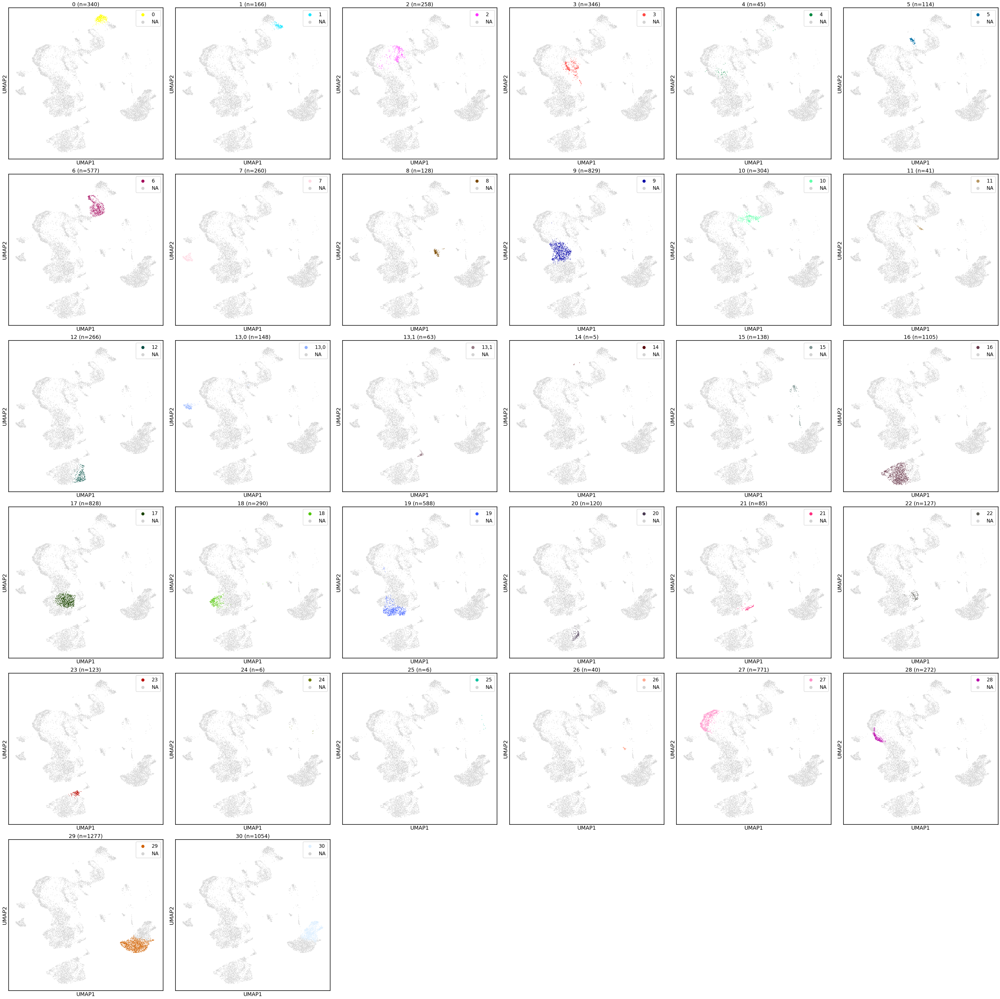

In [48]:
plot_UMAPs(adata)

fig.savefig(pltdir + 'all_individual_clusters_UMAP.pdf', bbox_inches='tight', dpi=300)

# Bone marrow individual cluster UMAPs

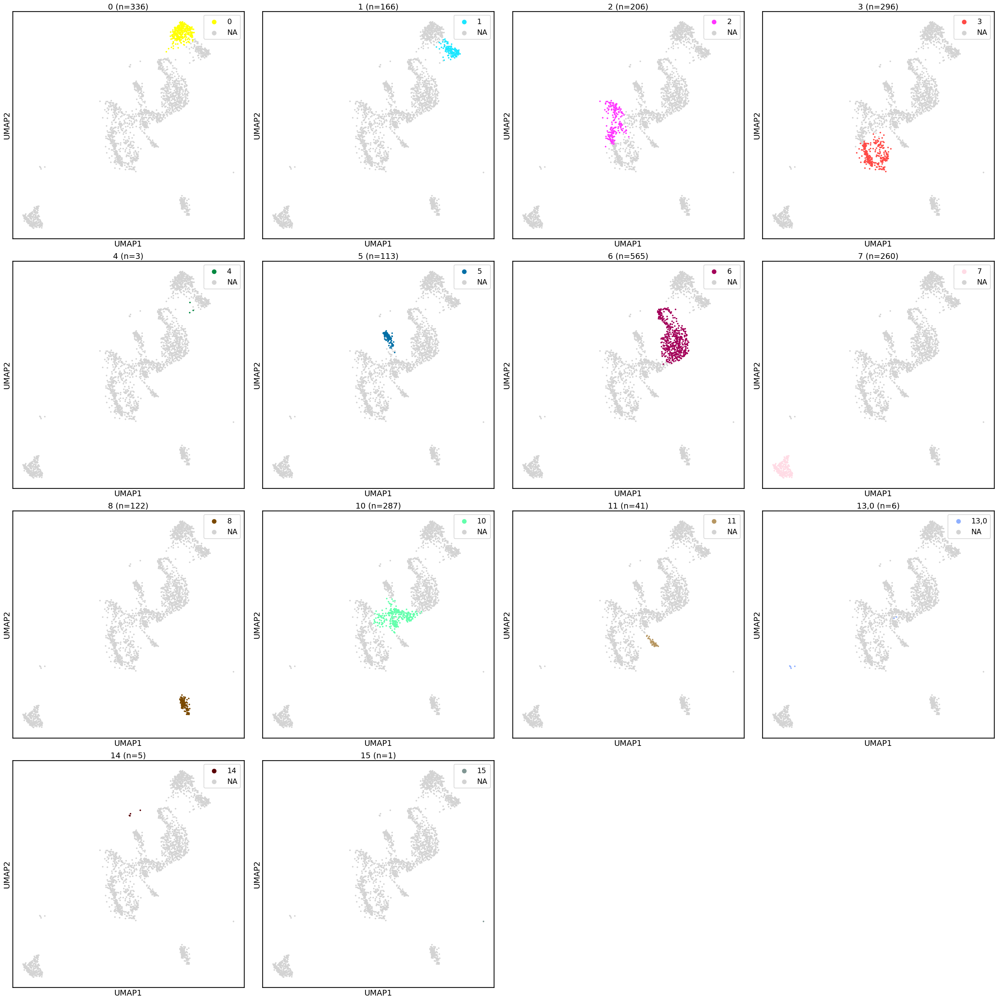

In [51]:
plot_UMAPs(adata, 'bm')

fig.savefig(pltdir + 'bm_individual_clusters_UMAP.pdf', bbox_inches='tight', dpi=300)

# MSC individual cluster UMAPs

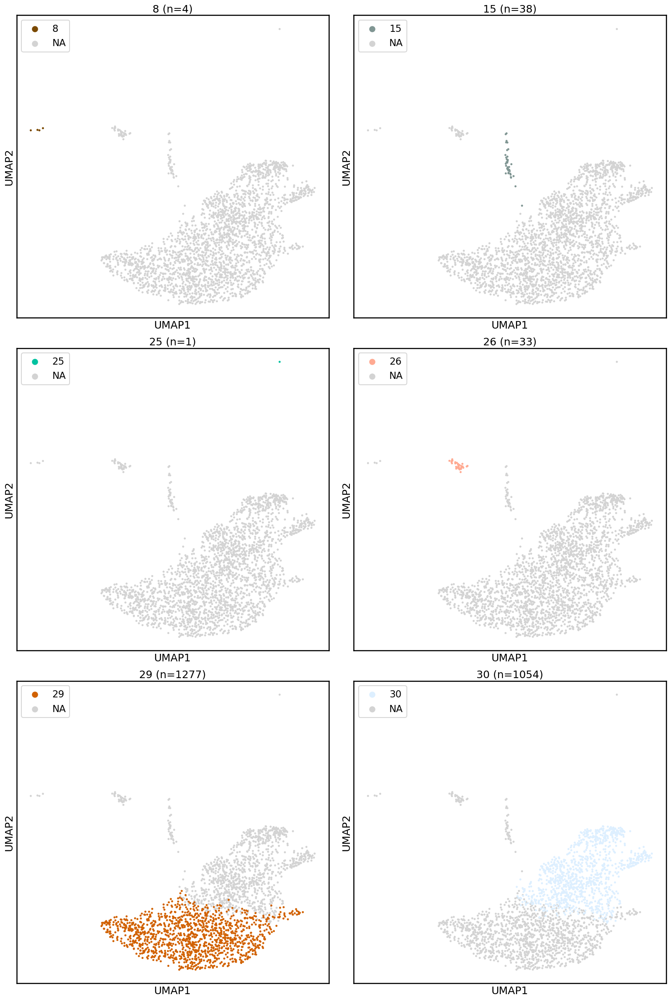

In [52]:
plot_UMAPs(adata, 'msc')

fig.savefig(pltdir + 'msc_individual_clusters_UMAP.pdf', bbox_inches='tight', dpi=300)

# Week 2 individual cluster UMAPs

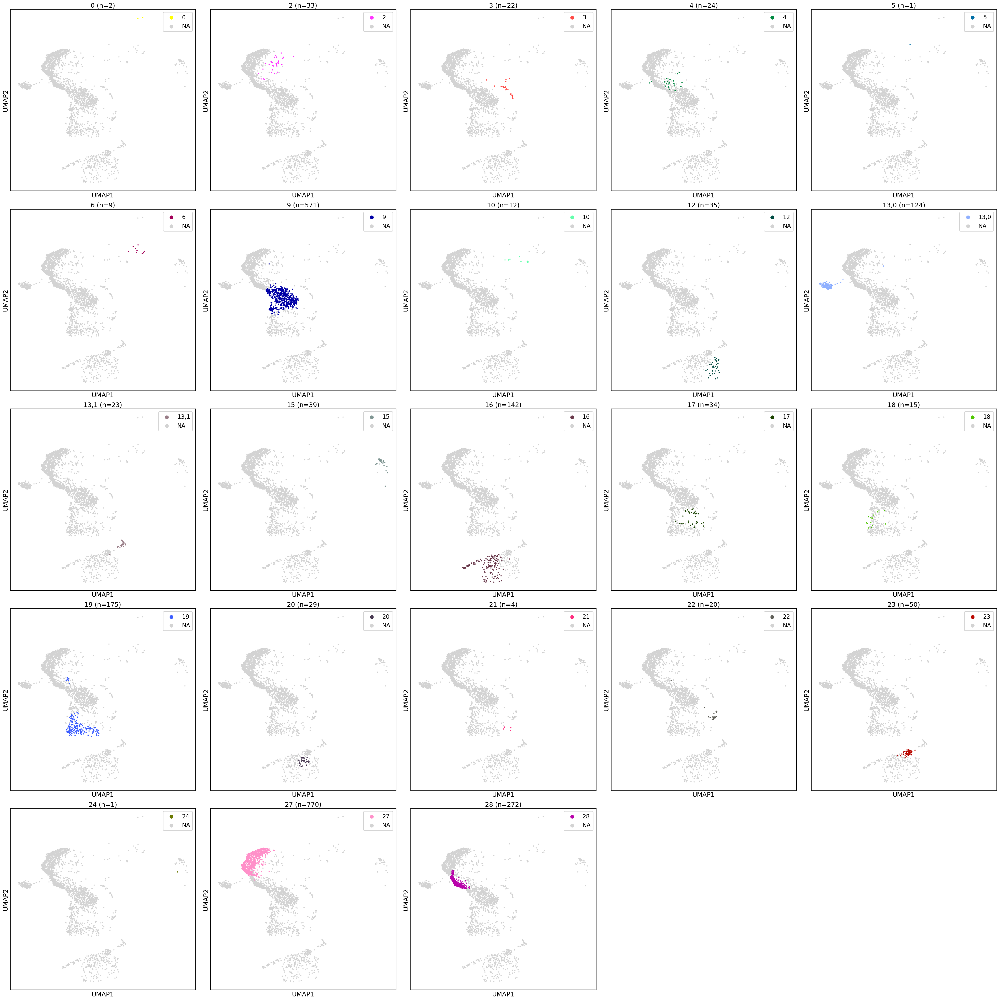

In [45]:
plot_UMAPs(adata, 'week2')

# Week 3 individual cluster UMAPs

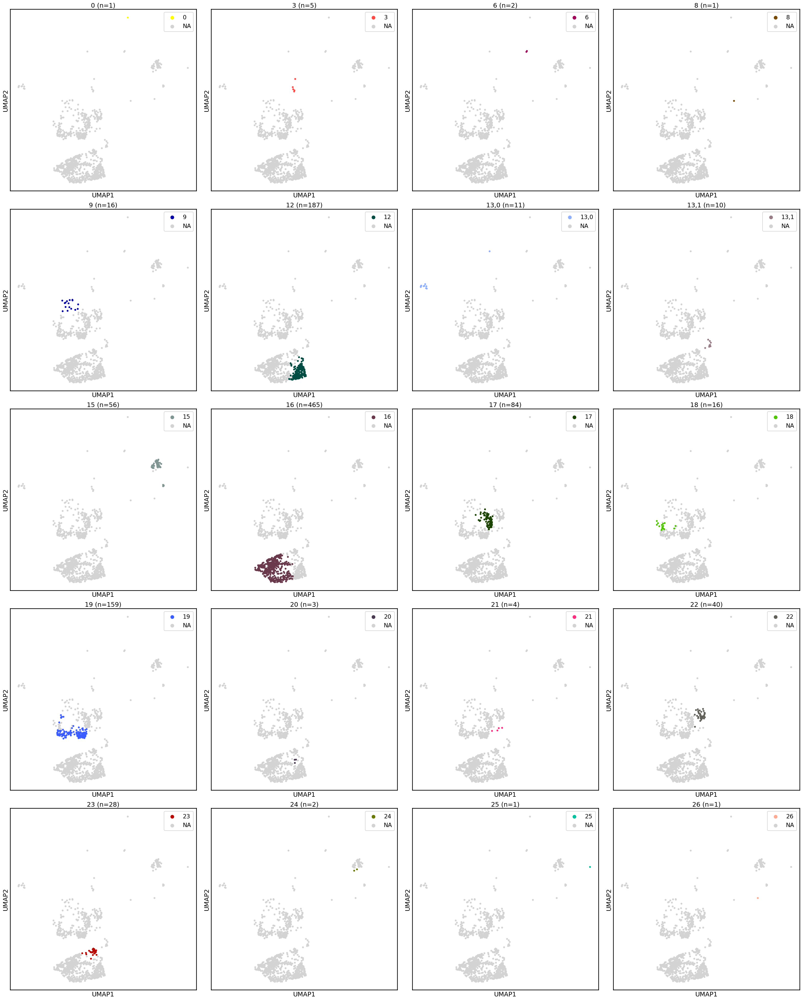

In [46]:
plot_UMAPs(adata, 'week3')

# Week 4 individual cluster UMAPs

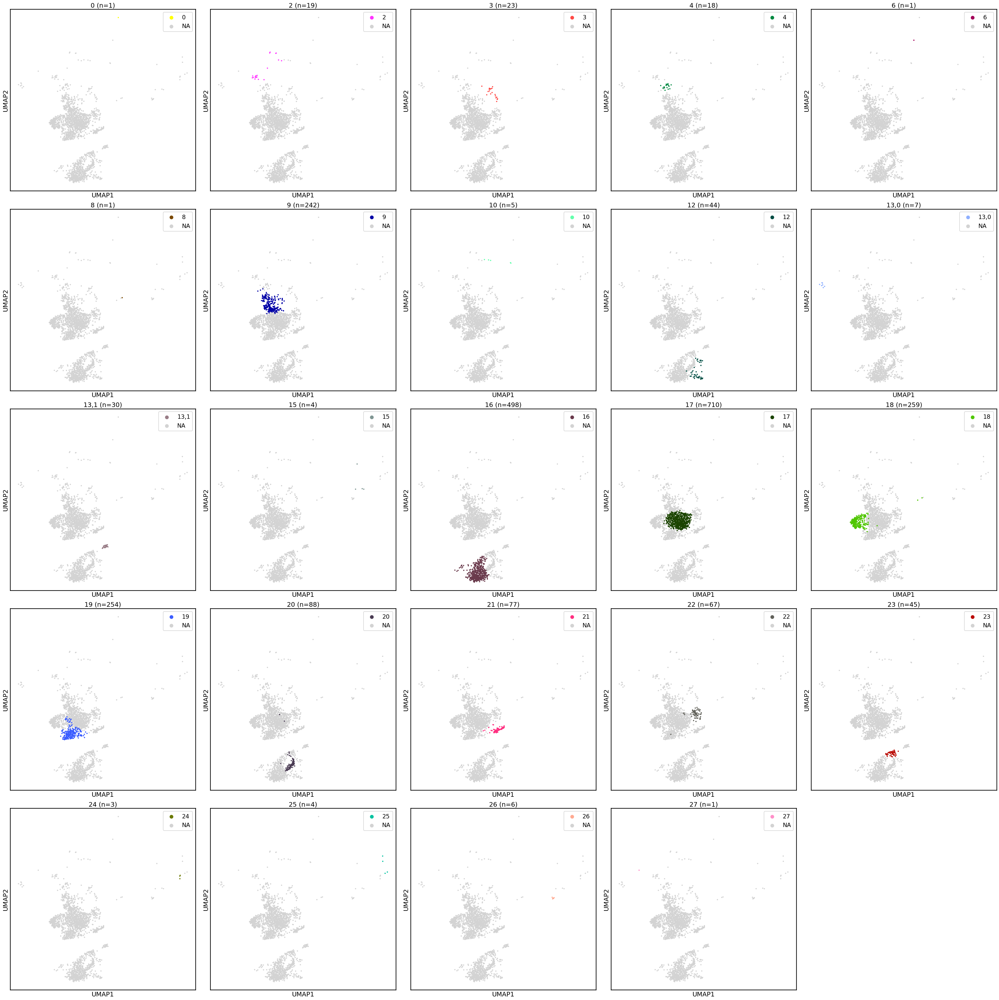

In [47]:
plot_UMAPs(adata, 'week4')